<a href="https://colab.research.google.com/github/babi00/ai4biological-pattern/blob/clean-barbara/barbara_new/REPORT_explainability_v0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Copy for GitHub

Explainability del classificatore di specie invasive. Qui si utilizza la tecnica Integrated Gradients, nello specifico la funzione Integrated Gradients della libreria captum.

Si può specificare il numero di samples da analizzare con ```num_images``` e si può filtrare per label desiderato (```target_label_name```) e specie desiderata (```species```).



In [ ]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, multilabel_confusion_matrix, confusion_matrix, ConfusionMatrixDisplay, f1_score
import seaborn as sns
import requests
from io import BytesIO
from google.colab import drive
import time
from tqdm import tqdm
!pip install open_clip_torch
!pip install captum
from captum.attr import IntegratedGradients
import open_clip
import random
import math
from collections import Counter
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import cv2


torch.manual_seed(42)
np.random.seed(42)

drive.mount('/content/drive')

# Clone the repository and checkout the 'clean-barbara' branch
!git clone --branch clean-barbara https://github.com/babi00/ai4biological-pattern.git
%cd ai4biological-pattern

# Enable sparse checkout
!git sparse-checkout init --cone

In [ ]:
class InvasiveSpeciesDataset(Dataset):
    def __init__(self, root_dir, transform=None, get_label_fn=None):
        self.root_dir = root_dir
        self.transform = transform
        self.entries = []
        self.label_map = {
            "native": 0,
            "introduced non-invasive": 1,
            "invasive": 2
        }

        taxa_folders = [d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d)) and d != "metadata"]
        for taxon in taxa_folders:
            meta_path = os.path.join(root_dir, "filtered_metadata", f"{taxon}_metadata.csv")
            if not os.path.exists(meta_path):
                continue
            metadata_df = pd.read_csv(meta_path)
            for idx, row in metadata_df.iterrows():
                self.entries.append((taxon, row))  # Just index, don’t open anything

    def __len__(self):
        return len(self.entries)

    def __getitem__(self, idx):
        taxon, row = self.entries[idx]
        filename = str(row["filename"])
        image_path = os.path.join(self.root_dir, taxon, filename)
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        label = self.label_map.get(row["label"])
        return image, label, idx

In [ ]:
#2.Define the embedding extractor:
#ResNet without the last FC layer
def get_resnet_embeddings_extractor_model():
    #Use a pre-trained ResNet18 model
    model = models.resnet18(weights='IMAGENET1K_V1')

    #Freeze all layers
    for param in model.parameters():
        param.requires_grad = False

    embeddings_extractor= nn.Sequential(*list(model.children())[:-1]) #removes the last FC layer
    print("Model obtained...")

    return embeddings_extractor

#BioCLIP model
def get_bioclip_embeddings_extractor_model(device, bioclip_version=2):
    if bioclip_version==2:
        print("BioCLIP 2!")
        model, _, preprocess = open_clip.create_model_and_transforms('hf-hub:imageomics/bioclip-2')
    else:
        model, _, preprocess = open_clip.create_model_and_transforms('hf-hub:imageomics/bioclip')
    print("Model obtained...")
    model.to(device)
    model.eval()
    return model, preprocess

In [ ]:
#•create a dummy image to take the embedding dimensions
def get_embedding_dim(embedding_model, preprocess, device):
    dummy_image = Image.new('RGB', (224, 224), color='white')
    image_tensor = preprocess(dummy_image).unsqueeze(0).to(device)
    with torch.no_grad():
        if hasattr(embedding_model, 'encode_image'):
            embedding = embedding_model.encode_image(image_tensor)
        else:
            embedding = embedding_model(image_tensor)

    embedding_dim = embedding.shape[1]
    return embedding_dim

In [ ]:
#Classifier
class InvasiveSpeciesClassifier(nn.Module):
    def __init__(self, embedding_dim, hidden_dim=256, num_classes=3):
        super().__init__()
        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, hidden_dim),
            nn.ReLU(), #consider adding a Dropout layer
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, num_classes)
        )

    def forward(self, x):
        return self.classifier(x)

In [ ]:
class FullModel(nn.Module):
    def __init__(self, embedding_model, classifier_head):
        super().__init__()
        self.embedding_model = embedding_model
        self.classifier_head = classifier_head

    def forward(self, x):
        if hasattr(self.embedding_model, 'encode_image'):
            features = self.embedding_model.encode_image(x)
        else:
            features = self.embedding_model(x)

        if features.ndim == 4:
            features = features.view(features.size(0), -1)

        return self.classifier_head(features)

In [ ]:
def visualize_attr_map(original_img_tensor, attribution_map):

    original_img = original_img_tensor.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()
    original_img = (original_img - original_img.min()) / (original_img.max() - original_img.min())  # normalize to [0,1]

    attribution_map_resized = attribution_map
    if attribution_map.shape != original_img.shape[:2]:
        attribution_map_resized = cv2.resize(attribution_map, (original_img.shape[1], original_img.shape[0]))

    heatmap = (attribution_map_resized - np.min(attribution_map_resized)) / (np.max(attribution_map_resized) - np.min(attribution_map_resized) + 1e-6)

    plt.figure(figsize=(12, 4))

    #Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title("Original Image")
    plt.axis('off')

    #Heatmap Only
    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='hot')
    plt.title("Attribution Heatmap")
    plt.axis('off')

    #Overlay
    plt.subplot(1, 3, 3)
    plt.imshow(original_img)
    plt.imshow(heatmap, cmap='hot', alpha=0.5)
    plt.title("Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
def visualize_integrated_gradients(model_name="first_attempt_with_class_weighting",model_dir="invasive_species",folder_name="taxas",num_images=5,target_label_name=None,species=None,use_bioclip=True,bioclip_version=None):
    torch.cuda.empty_cache()

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model_name = f'bioclip_2_{model_name}' if use_bioclip and bioclip_version==2 else f'bioclip_1_{model_name}' if use_bioclip else f'resnet_{model_name}'
    classifier_path = f'/content/drive/MyDrive/TESI - PoliTO/{model_dir}/classifier_head_{model_name}.pth'
    github = '/content/ai4biological-pattern/barbara_new'
    github_repository = f'{github}/{folder_name}'

    if not os.path.isdir(github_repository):
        !git sparse-checkout set barbara_new/{folder_name}
        !git checkout clean-barbara

    feature_extractor, preprocess = get_bioclip_embeddings_extractor_model(device, bioclip_version=bioclip_version)
    feature_extractor.eval().to(device)

    classifier = InvasiveSpeciesClassifier(embedding_dim=get_embedding_dim(feature_extractor, preprocess, device))
    classifier.load_state_dict(torch.load(classifier_path, map_location=device))
    classifier.eval().to(device)

    model = FullModel(feature_extractor, classifier).to(device)
    model.eval()

    dataset = InvasiveSpeciesDataset(root_dir=github_repository, transform=preprocess)

    label_id = dataset.label_map.get(target_label_name) if target_label_name else None

    processed = 0

    for i in range(len(dataset)):
        if processed >= num_images:
            break

        image_tensor, label, idx = dataset[i]

        if label_id is not None and label != label_id:
            print("skip")
            continue

        taxon, row = dataset.entries[idx]
        if species and taxon != species:
            continue

        filename = row["filename"]
        image_path = os.path.join(github_repository, taxon, filename)

        print(f"\nProcessing: {filename} (Species: {taxon})")

        input_tensor = image_tensor.unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(input_tensor)
            probs = F.softmax(output, dim=1)
            pred_class = torch.argmax(probs, dim=1).item()
            confidence = probs[0, pred_class].item()

        print(f"Predicted class: {pred_class}, confidence: {confidence:.4f}")
        if label_id is not None and pred_class != label_id:
            print("mis-classified")
            continue

        baseline = torch.zeros_like(input_tensor).to(device)

        ig = IntegratedGradients(model)
        attr, delta = ig.attribute(
            input_tensor,
            baselines=baseline,
            target=pred_class,
            return_convergence_delta=True,
            n_steps=100, #modified
            internal_batch_size=5, #modified
        )

        attributions = attr.squeeze().cpu().detach().numpy()
        attributions = np.sum(attributions, axis=0)
        attributions = np.maximum(attributions, 0)
        attributions = attributions / (attributions.max() + 1e-6)

        visualize_attr_map(input_tensor, attributions)
        processed += 1



```
visualize_integrated_gradients(bioclip_version=2)
```
Processing: lythrum_californicum_001.jpg (Species: lythrum_californicum)
Predicted class: 0, confidence: 1.0000
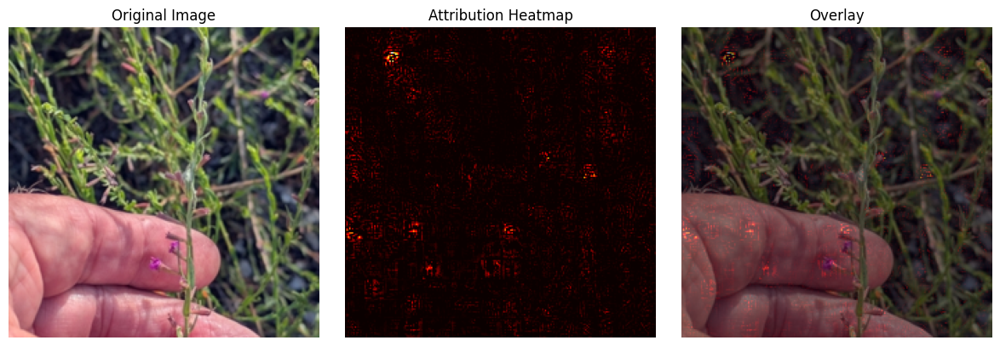
Processing: lythrum_californicum_002.jpg (Species: lythrum_californicum)
Predicted class: 0, confidence: 1.0000
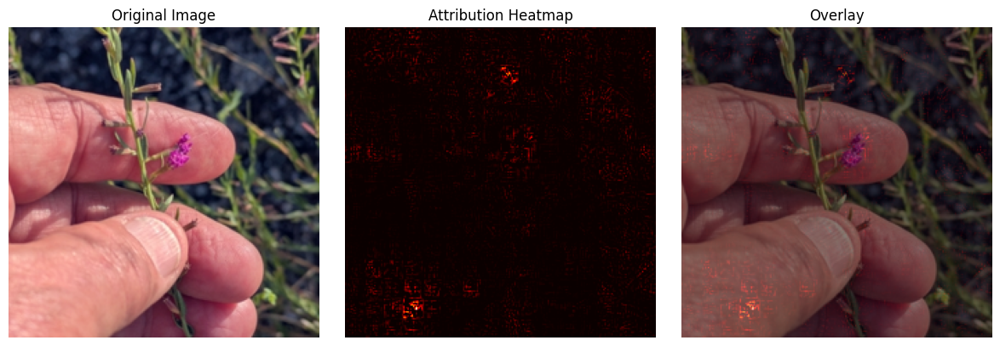
Processing: lythrum_californicum_003.jpg (Species: lythrum_californicum)
Predicted class: 0, confidence: 1.0000
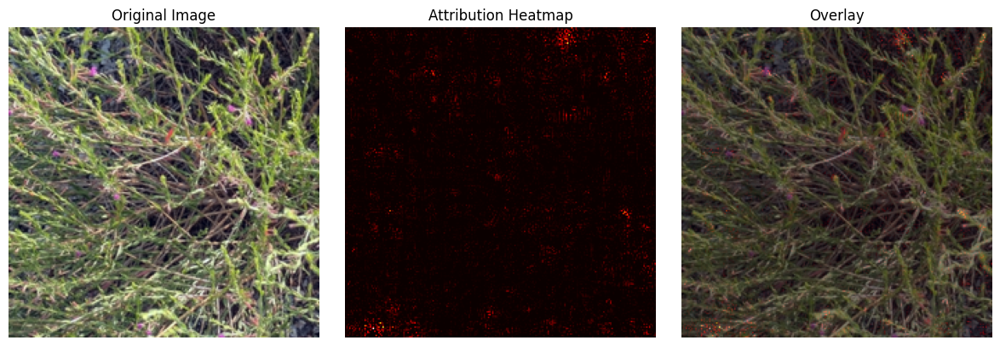Processing: lythrum_californicum_003.jpg (Species: lythrum_californicum)
Predicted class: 0, confidence: 1.0000

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Model obtained...

Processing: lythrum_baeticum_001.jpg (Species: lythrum_baeticum)
Predicted class: 1, confidence: 1.0000


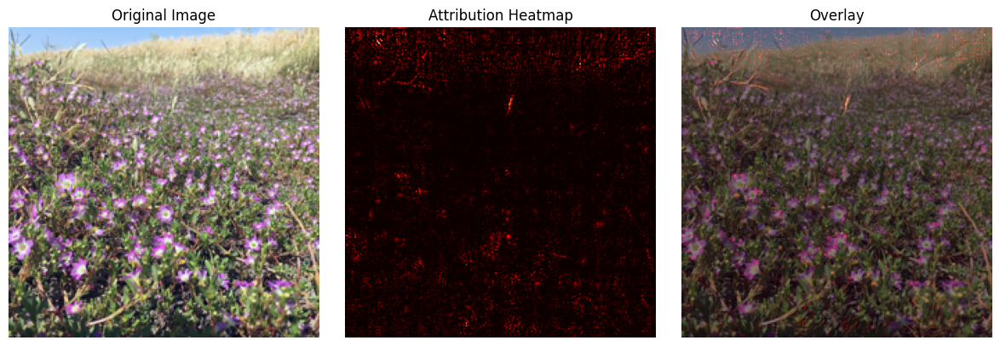


Processing: lythrum_baeticum_002.jpg (Species: lythrum_baeticum)
Predicted class: 1, confidence: 1.0000


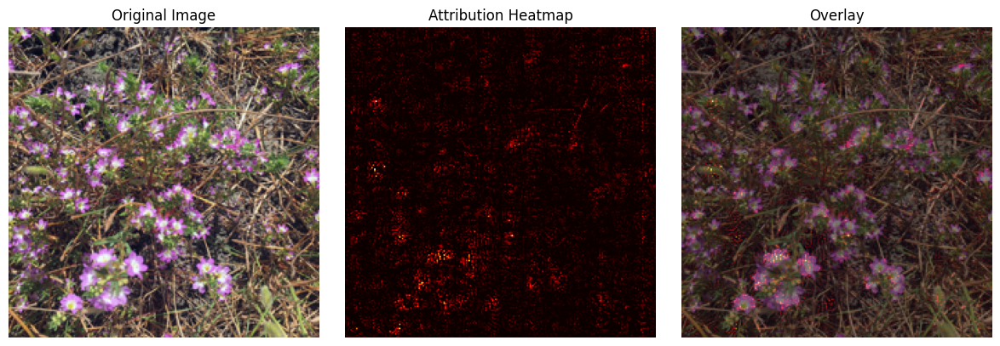


Processing: lythrum_baeticum_003.jpg (Species: lythrum_baeticum)
Predicted class: 1, confidence: 1.0000


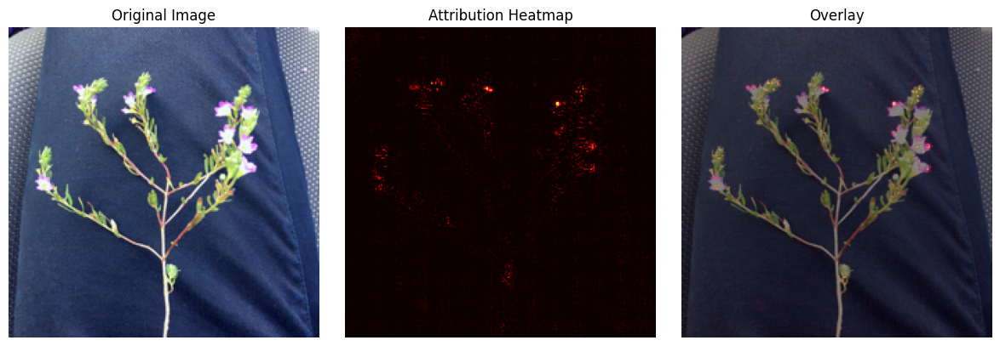


Processing: lythrum_flagellare_001.jpg (Species: lythrum_flagellare)
Predicted class: 0, confidence: 1.0000


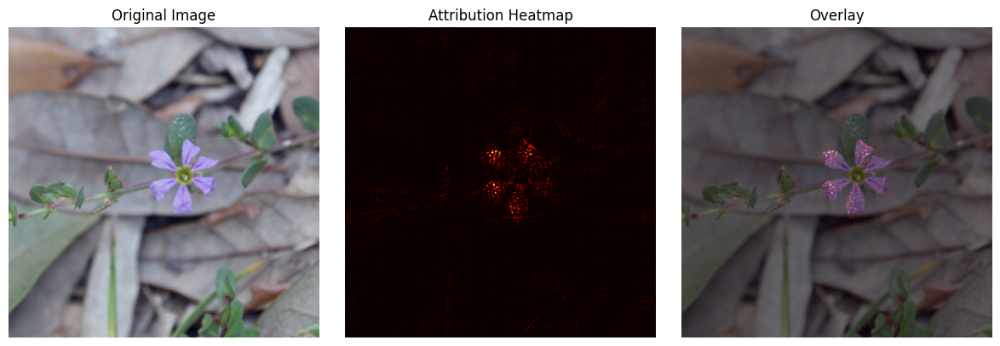


Processing: lythrum_flagellare_002.jpg (Species: lythrum_flagellare)
Predicted class: 0, confidence: 1.0000


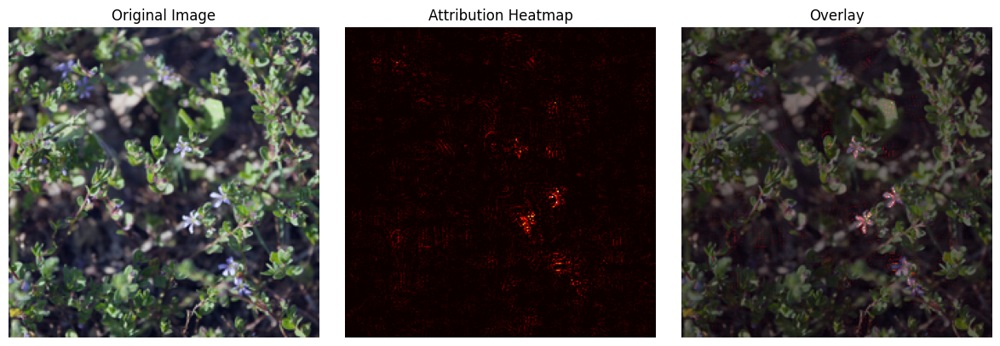

In [ ]:
visualize_integrated_gradients()

Model obtained...

Processing: lythrum_baeticum_001.jpg (Species: lythrum_baeticum)
Predicted class: 1, confidence: 1.0000
mis-classified

Processing: lythrum_baeticum_002.jpg (Species: lythrum_baeticum)
Predicted class: 1, confidence: 1.0000
mis-classified

Processing: lythrum_baeticum_003.jpg (Species: lythrum_baeticum)
Predicted class: 1, confidence: 1.0000
mis-classified

Processing: lythrum_flagellare_001.jpg (Species: lythrum_flagellare)
Predicted class: 0, confidence: 1.0000


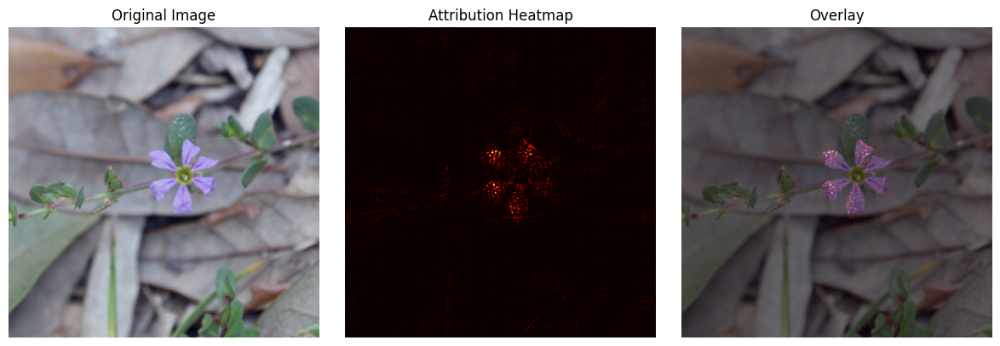


Processing: lythrum_flagellare_002.jpg (Species: lythrum_flagellare)
Predicted class: 0, confidence: 1.0000


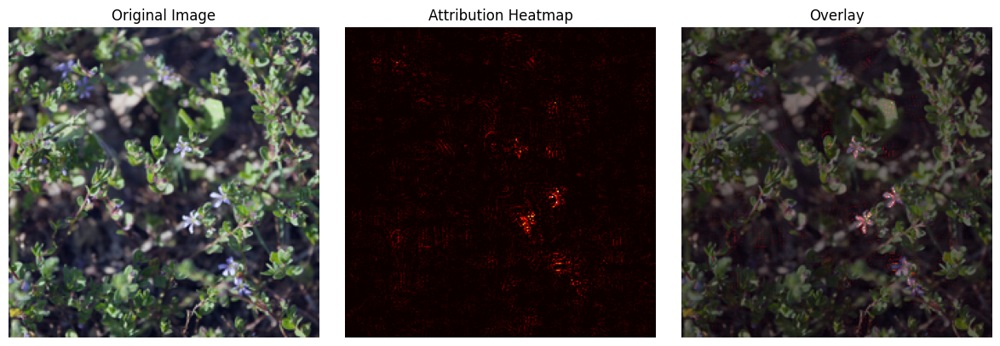


Processing: lythrum_flagellare_003.jpg (Species: lythrum_flagellare)
Predicted class: 0, confidence: 1.0000


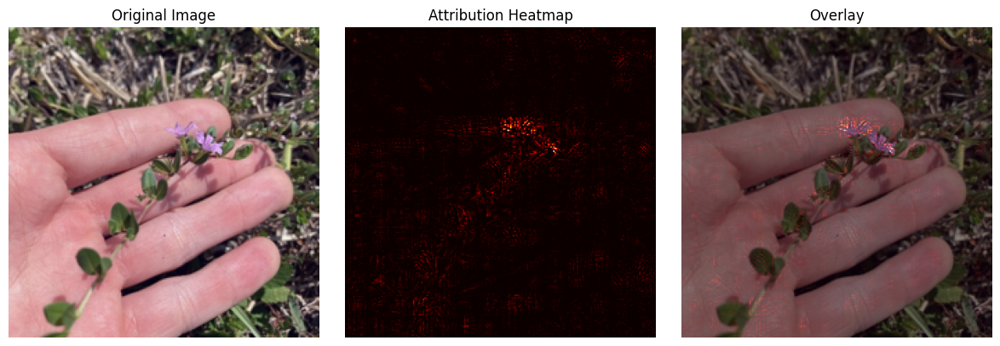


Processing: lythrum_flagellare_004.jpg (Species: lythrum_flagellare)
Predicted class: 0, confidence: 1.0000


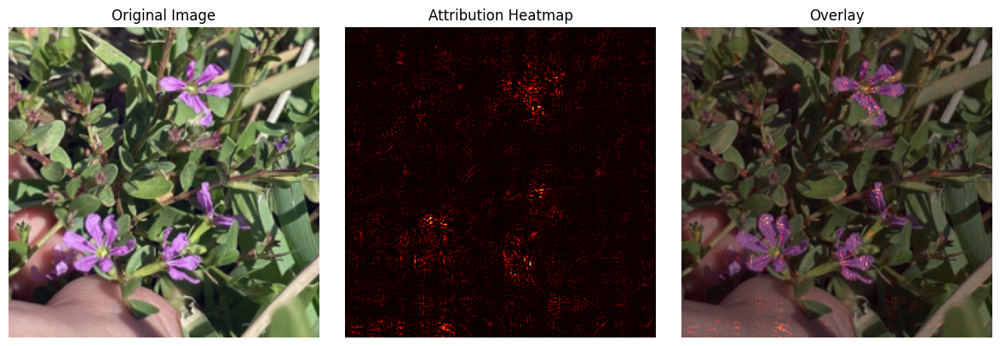


Processing: lythrum_flagellare_005.jpg (Species: lythrum_flagellare)
Predicted class: 0, confidence: 0.9926


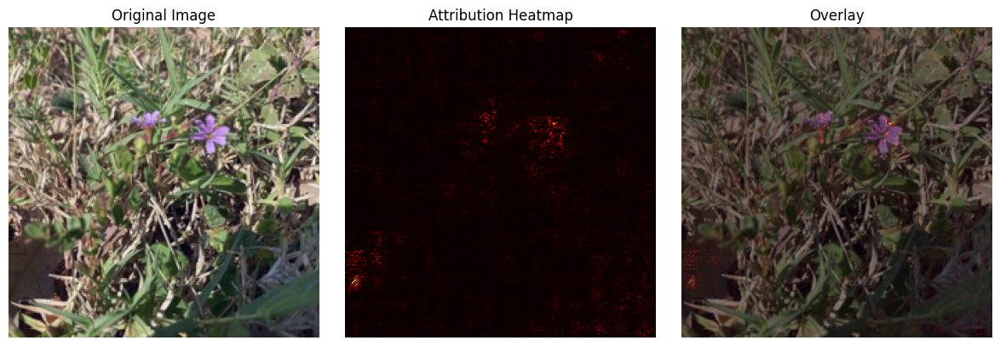

In [ ]:
visualize_integrated_gradients(target_label_name="native")

Model obtained...

Processing: lythrum_hyssopifolia_001.jpg (Species: lythrum_hyssopifolia)
Predicted class: 2, confidence: 0.8321


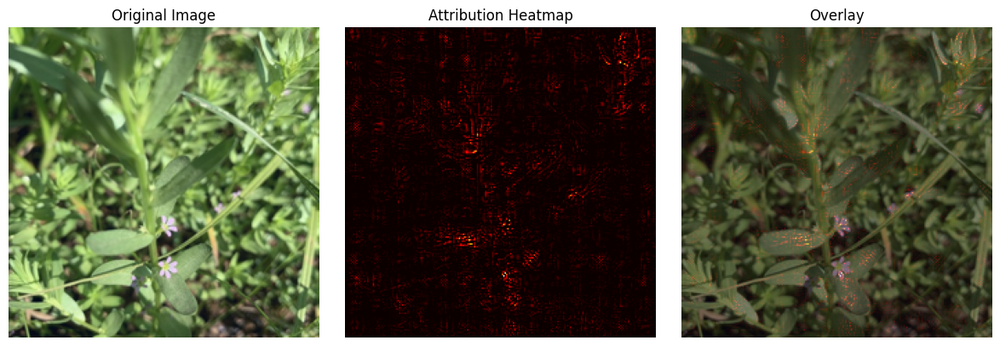


Processing: lythrum_hyssopifolia_002.jpg (Species: lythrum_hyssopifolia)
Predicted class: 2, confidence: 1.0000


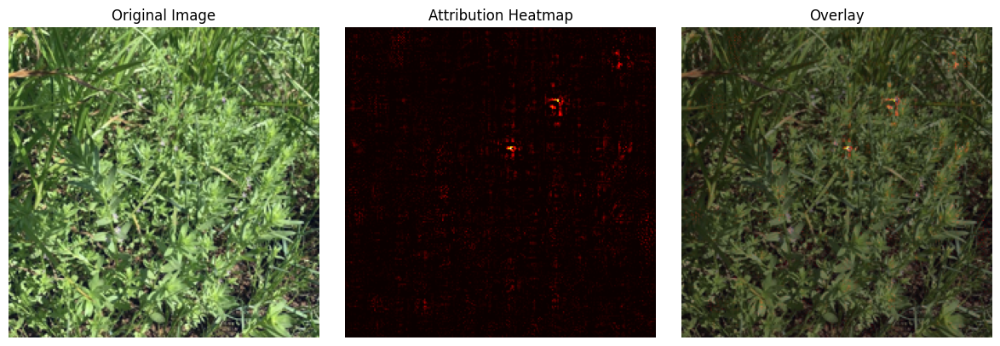


Processing: lythrum_hyssopifolia_003.jpg (Species: lythrum_hyssopifolia)
Predicted class: 2, confidence: 1.0000


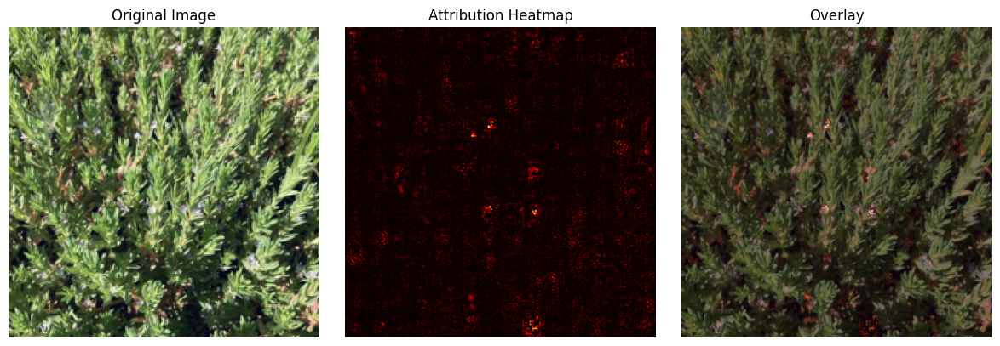


Processing: lythrum_hyssopifolia_004.jpg (Species: lythrum_hyssopifolia)
Predicted class: 2, confidence: 1.0000


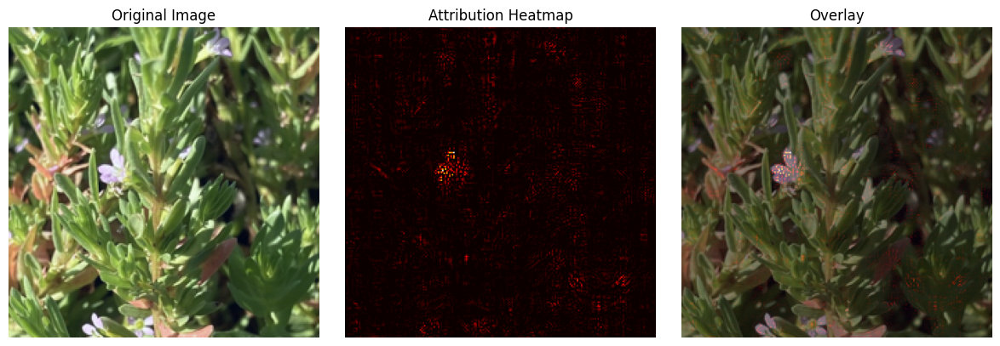


Processing: lythrum_hyssopifolia_005.jpg (Species: lythrum_hyssopifolia)
Predicted class: 2, confidence: 1.0000


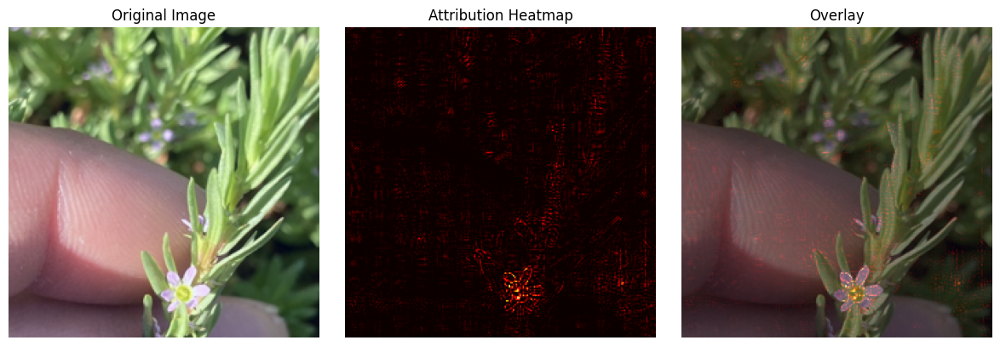

In [ ]:
visualize_integrated_gradients(species="lythrum_hyssopifolia")

In [ ]:
visualize_integrated_gradients(bioclip_version=2)

#ERROR I GET:
OutOfMemoryError: CUDA out of memory. Tried to allocate 402.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 188.12 MiB is free. Process 61418 has 14.55 GiB memory in use. Of the allocated memory 14.35 GiB is allocated by PyTorch, and 67.92 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)